In [1]:
import pandas as pd
from pandas import DataFrame
import numpy as np
import pyarrow.parquet as pq
import glob

import matplotlib.pyplot as plt
import plotly.offline as pyo
from plotly.graph_objs import *

import seaborn as sns

from datetime import datetime

In [2]:
pyo.offline.init_notebook_mode()

In [3]:
files = glob.glob("ADA-USD-21Z31/*.parquet")
first = True
for file in files:
    new_df = pq.read_table(file).to_pandas()
    if first:
        ada_21z31_df = new_df
        first = False
    else:
        ada_21z31_df = pd.concat([ada_21z31_df, new_df])

In [4]:
files = glob.glob("ADA-USDT/*.parquet")
first = True
for file in files:
    new_df = pq.read_table(file).to_pandas()
    if first:
        ada_usdt_df = new_df
        first = False
    else:
        ada_usdt_df = pd.concat([ada_usdt_df, new_df])

In [5]:
files = glob.glob("ADA-USD-22H25/*.parquet")
first = True
for file in files:
    new_df = pq.read_table(file).to_pandas()
    if first:
        ada_22h25_df = new_df
        first = False
    else:
        ada_22h25_df = pd.concat([ada_22h25_df, new_df])

In [6]:
files = glob.glob("ADA-USD-PERP/*.parquet")
first = True
for file in files:
    new_df = pq.read_table(file).to_pandas()
    if first:
        ada_perp_df = new_df
        first = False
    else:
        ada_perp_df = pd.concat([ada_perp_df, new_df])

In [7]:
ada_21z31_df.describe()
ada_21z31_df.head()

,exchange,symbol,start,stop,interval,trades,open,close,high,low,volume,closed,timestamp,receipt_timestamp
0,BINANCE_DELIVERY,ADA-USD-21Z31,1633828080.0,1633828139.999,1m,93,2.30293,2.30141,2.30293,2.30001,3824.0,False,1633828132.205,1633828132.2884088
1,BINANCE_DELIVERY,ADA-USD-21Z31,1633828080.0,1633828139.999,1m,94,2.30293,2.30146,2.30293,2.30001,3900.0,True,1633828142.001,1633828142.0845523
2,BINANCE_DELIVERY,ADA-USD-21Z31,1633828140.0,1633828199.999,1m,1,2.30185,2.30185,2.30185,2.30185,9.0,False,1633828151.095,1633828151.17755
3,BINANCE_DELIVERY,ADA-USD-21Z31,1633828140.0,1633828199.999,1m,2,2.30185,2.30169,2.30185,2.30169,10.0,False,1633828156.916,1633828157.0023255
4,BINANCE_DELIVERY,ADA-USD-21Z31,1633828140.0,1633828199.999,1m,3,2.30185,2.30156,2.30185,2.30156,11.0,False,1633828157.445,1633828157.5273275


In [8]:
ada_perp_df.describe()
ada_perp_df.head()

,exchange,symbol,start,stop,interval,trades,open,close,high,low,volume,closed,timestamp,receipt_timestamp
0,BINANCE_DELIVERY,ADA-USD-PERP,1633849980.0,1633850039.999,1m,67,2.27214,2.27168,2.2737,2.27168,13046.0,False,1633850034.55,1633850034.6369467
1,BINANCE_DELIVERY,ADA-USD-PERP,1633849980.0,1633850039.999,1m,68,2.27214,2.27168,2.2737,2.27168,13081.0,False,1633850036.412,1633850036.4984376
2,BINANCE_DELIVERY,ADA-USD-PERP,1633849980.0,1633850039.999,1m,68,2.27214,2.27168,2.2737,2.27168,13081.0,True,1633850042.001,1633850042.0867572
3,BINANCE_DELIVERY,ADA-USD-PERP,1633850040.0,1633850099.999,1m,1,2.27169,2.27169,2.27169,2.27169,10.0,False,1633850046.485,1633850046.5722952
4,BINANCE_DELIVERY,ADA-USD-PERP,1633850040.0,1633850099.999,1m,2,2.27169,2.27169,2.27169,2.27169,170.0,False,1633850048.29,1633850048.3773522


In [8]:
# Sorting data by timestamp
# ada_21z31_df, ada_usdt_df, ada_22h25_df, ada_perp_df
try:
    ada_21z31_df["timestamp"]=ada_21z31_df["timestamp"].astype(float)
    ada_usdt_df["timestamp"]=ada_usdt_df["timestamp"].astype(float)
    ada_22h25_df["timestamp"]=ada_22h25_df["timestamp"].astype(float)
    ada_perp_df["timestamp"]=ada_perp_df["timestamp"].astype(float)
except:
    print("already converted")
    
ada_21z31_df = ada_21z31_df.sort_values(by='timestamp', ascending=True)
ada_usdt_df = ada_usdt_df.sort_values(by='timestamp', ascending=True)
ada_22h25_df = ada_22h25_df.sort_values(by='timestamp', ascending=True)
ada_perp_df = ada_perp_df.sort_values(by='timestamp', ascending=True)

In [9]:
# Converting all string datatype to float
ada_21z31_df["close"]=ada_21z31_df["close"].astype(float)
ada_21z31_df["open"]=ada_21z31_df["open"].astype(float)
ada_21z31_df["high"]=ada_21z31_df["high"].astype(float)
ada_21z31_df["low"]=ada_21z31_df["low"].astype(float)
ada_21z31_df["volume"]=ada_21z31_df["volume"].astype(float)

ada_usdt_df["close"]=ada_usdt_df["close"].astype(float)
ada_usdt_df["open"]=ada_usdt_df["open"].astype(float)
ada_usdt_df["high"]=ada_usdt_df["high"].astype(float)
ada_usdt_df["low"]=ada_usdt_df["low"].astype(float)
ada_usdt_df["volume"]=ada_usdt_df["volume"].astype(float)

ada_22h25_df["close"]=ada_22h25_df["close"].astype(float)
ada_22h25_df["open"]=ada_22h25_df["open"].astype(float)
ada_22h25_df["high"]=ada_22h25_df["high"].astype(float)
ada_22h25_df["low"]=ada_22h25_df["low"].astype(float)
ada_22h25_df["volume"]=ada_22h25_df["volume"].astype(float)

ada_perp_df["close"]=ada_perp_df["close"].astype(float)
ada_perp_df["open"]=ada_perp_df["open"].astype(float)
ada_perp_df["high"]=ada_perp_df["high"].astype(float)
ada_perp_df["low"]=ada_perp_df["low"].astype(float)
ada_perp_df["volume"]=ada_perp_df["volume"].astype(float)

# Adding a new volume column that are in USD
# ada_21z31_df, ada_usdt_df, ada_22h25_df, ada_perp_df
ada_21z31_df["usd_volume"]=ada_21z31_df["volume"] * ada_21z31_df["close"]
ada_usdt_df["usd_volume"]=ada_usdt_df["volume"] * ada_usdt_df["close"]
ada_22h25_df["usd_volume"]=ada_22h25_df["volume"] * ada_22h25_df["close"]
ada_perp_df["usd_volume"]=ada_perp_df["volume"] * ada_perp_df["close"]

# Converting epoch to datetime
try:
    ada_21z31_df["timestamp"] = [datetime.fromtimestamp(x) for x in ada_21z31_df["timestamp"]]
    ada_usdt_df["timestamp"] = [datetime.fromtimestamp(x) for x in ada_usdt_df["timestamp"]]
    ada_22h25_df["timestamp"] = [datetime.fromtimestamp(x) for x in ada_22h25_df["timestamp"]]
    ada_perp_df["timestamp"] = [datetime.fromtimestamp(x) for x in ada_perp_df["timestamp"]]
except:
    print("already converted")

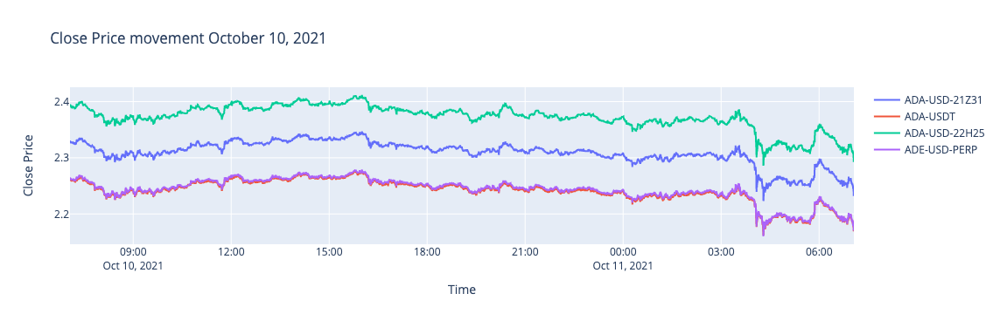

In [10]:
# ada_21z31_df, ada_usdt_df, ada_22h25_df, ada_perp_df

# ada_21z31_trace = {'type' : 'scatter',
#              'x': ada_21z31_df["timestamp"],
#              'y': ada_21z31_df["close"],
#              'name' : 'ada_21z31_trace',
#              'mode' : 'lines'}
# ada_21z31_fig = Figure(data = [ada_21z31_trace], layout = ada_21z31_layout)
# pyo.iplot(ada_21z31_fig)

ada_21z31_trace = {'type' : 'scatter',
             'x': ada_21z31_df["timestamp"],
             'y': ada_21z31_df["close"],
             'name' : 'ADA-USD-21Z31',
             'mode' : 'lines'}

ada_usdt_trace = {'type' : 'scatter',
             'x': ada_usdt_df["timestamp"],
             'y': ada_usdt_df["close"],
             'name' : 'ADA-USDT',
             'mode' : 'lines'}

ada_22h25_trace = {'type' : 'scatter',
             'x': ada_22h25_df["timestamp"],
             'y': ada_22h25_df["close"],
             'name' : 'ADA-USD-22H25',
             'mode' : 'lines'}

ada_perp_trace = {'type' : 'scatter',
             'x': ada_perp_df["timestamp"],
             'y': ada_perp_df["close"],
             'name' : 'ADE-USD-PERP',
             'mode' : 'lines'}

multi_data = [ada_21z31_trace, ada_usdt_trace, ada_22h25_trace, ada_perp_trace]
multi_layout = {'title' : 'Close Price movement October 10, 2021', 'xaxis' : {'title': 'Time'}, 'yaxis': {'title' : 'Close Price'}}
multi_fig = Figure(data = multi_data, layout = multi_layout)
pyo.iplot(multi_fig)

In [61]:
import plotly.express as px

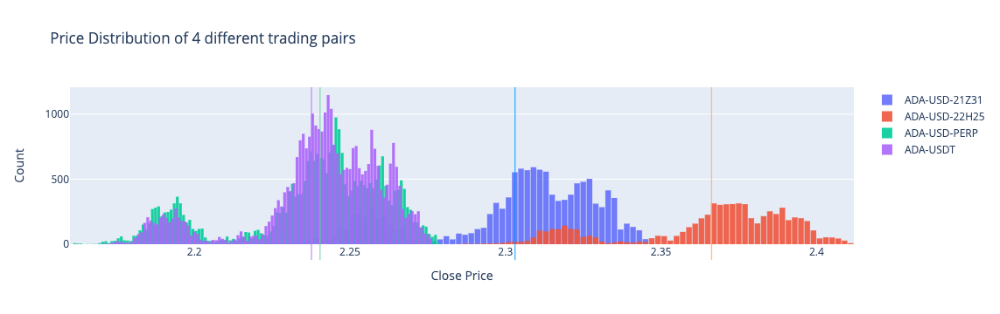

In [112]:
# plt.hist(ada_21z31_df["close"], label="ADA-USD-21Z31")
# px.histogram(ada_21z31_df, x="close", marginal = 'box')

his_fig = Figure()
his_fig.add_trace(Histogram(x=ada_21z31_df["close"], name='ADA-USD-21Z31'))
his_fig.add_trace(Histogram(x=ada_22h25_df["close"], name='ADA-USD-22H25'))
his_fig.add_trace(Histogram(x=ada_perp_df["close"], name= 'ADA-USD-PERP'))
his_fig.add_trace(Histogram(x=ada_usdt_df["close"], name='ADA-USDT'))

his_fig.update_layout(
    barmode='overlay',
    title_text='Price Distribution of 4 different trading pairs', # title of plot
    xaxis_title_text='Close Price', # xaxis label
    yaxis_title_text='Count', # yaxis label
    bargap=0.1, # gap between bars of adjacent location coordinates
    shapes= [
        {'line': {'color': '#0099FF', 'dash': 'solid', 'width': 1},
        'type': 'line',
        'x0': ada_21z31_df["close"].mean(),
        'x1': ada_21z31_df["close"].mean(),
        'xref': 'x',
        'y0': -0.1,
        'y1': 1,
        'yref': 'paper'},
       {'line': {'color': '#FDAB5A', 'dash': 'solid', 'width': 1},
        'type': 'line',
        'x0': ada_22h25_df["close"].mean(),
        'x1': ada_22h25_df["close"].mean(),
        'xref': 'x',
        'y0': -0.1,
        'y1': 1,
        'yref': 'paper'},
        {'line': {'color': '#b373fa', 'dash': 'solid', 'width': 1},
        'type': 'line',
        'x0': ada_perp_df["close"].mean(),
        'x1': ada_perp_df["close"].mean(),
        'xref': 'x',
        'y0': -0.1,
        'y1': 1,
        'yref': 'paper'},
        {'line': {'color': '#6DCEA4', 'dash': 'solid', 'width': 1},
        'type': 'line',
        'x0': ada_usdt_df["close"].mean(),
        'x1': ada_usdt_df["close"].mean(),
        'xref': 'x',
        'y0': -0.1,
        'y1': 1,
        'yref': 'paper'}]
)
# Reduce opacity to see both histograms
his_fig.update_traces(opacity=0.9)
his_fig.show()

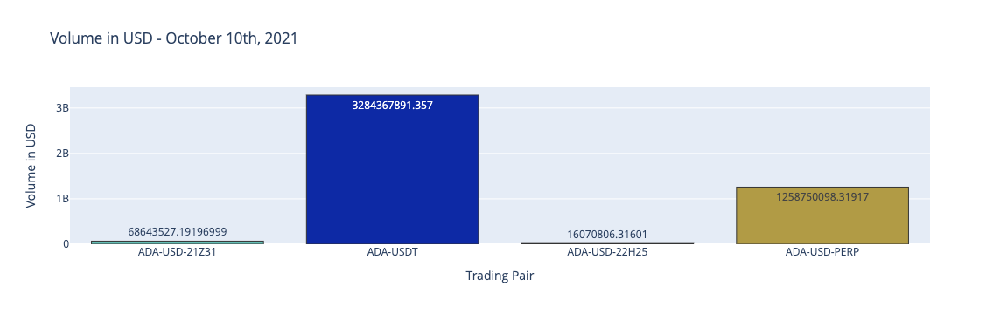

In [18]:
# ada_21z31_df, ada_usdt_df, ada_22h25_df, ada_perp_df

bar_desc = """
This bar graph compare trading volume of 4 different trading 
pairs on October 10th, 2021. SOL-USDT & BNB-USDT reached 
nearly $4B USD of trading volume while ADA-USDT & DOGE-USDT 
around $3B USD
"""
usd_volumes = [ada_21z31_df["usd_volume"].sum(), ada_usdt_df["usd_volume"].sum(), ada_22h25_df["usd_volume"].sum(), ada_perp_df["usd_volume"].sum()]

bar_trace = {'type' : 'bar',
             'x' : ['ADA-USD-21Z31', 'ADA-USDT', 'ADA-USD-22H25', 'ADA-USD-PERP'],
             'y': usd_volumes,
             'text': usd_volumes,
             'marker': {'color' : ['#63BDB4', '#0D29A5', '#E3B64C', '#B19B45'], 
                        'line' : {'color' : '#333', 'width' : 1}}}

bar_laytout = {'title' : 'Volume in USD - October 10th, 2021', 
               'xaxis' : {'title': 'Trading Pair'}, 
               'yaxis' : {'title' : 'Volume in USD'},
               'annotations' : [{'text' : bar_desc,
                                 'font' : {'color' : 'black', 'size' : 14},
                                 'xref' : 'paper',
                                 'yref' : 'paper',
                                 'x' : 0,
                                 'y' : -0.4,
                                 'showarrow' : False}]}

fig = Figure(data = [bar_trace], layout = bar_laytout)
pyo.iplot(fig)

In [19]:
# ada_21z31_df, ada_usdt_df, ada_22h25_df, ada_perp_df

ada_21z31_df.corr(method ='pearson')

,open,close,high,low,volume,usd_volume
open,1.000000,0.991988,0.996105,0.994553,-0.191997,-0.189060
close,0.991988,1.000000,0.995554,0.997032,-0.221415,-0.217963
high,0.996105,0.995554,1.000000,0.992431,-0.160792,-0.157560
low,0.994553,0.997032,0.992431,1.000000,-0.253418,-0.250219
volume,-0.191997,-0.221415,-0.160792,-0.253418,1.000000,0.999927
usd_volume,-0.189060,-0.217963,-0.157560,-0.250219,0.999927,1.000000


In [20]:
# from ta import add_all_ta_features
# from ta.utils import dropna
# from ta.volatility import BollingerBands
# ada_21z31_df['close'] = ada_21z31_df['close'].ffill()
# ada_21z31_df = ada_21z31_df.bfill(axis=1)


# indicator_bb = BollingerBands(close=ada_21z31_df["close"], window=20, window_dev=2)

# # Add Bollinger Bands features
# ada_21z31_df['bb_bbm'] = indicator_bb.bollinger_mavg()
# ada_21z31_df['bb_bbh'] = indicator_bb.bollinger_hband()
# ada_21z31_df['bb_bbl'] = indicator_bb.bollinger_lband()

# # Add Bollinger Band high indicator
# ada_21z31_df['bb_bbhi'] = indicator_bb.bollinger_hband_indicator()

# # Add Bollinger Band low indicator
# ada_21z31_df['bb_bbli'] = indicator_bb.bollinger_lband_indicator()

# # Add Width Size Bollinger Bands
# ada_21z31_df['bb_bbw'] = indicator_bb.bollinger_wband()

# # Add Percentage Bollinger Bands
# ada_21z31_df['bb_bbp'] = indicator_bb.bollinger_pband()

# ada_21z31_df.head(n=20)

In [52]:
import plotly.figure_factory as ff

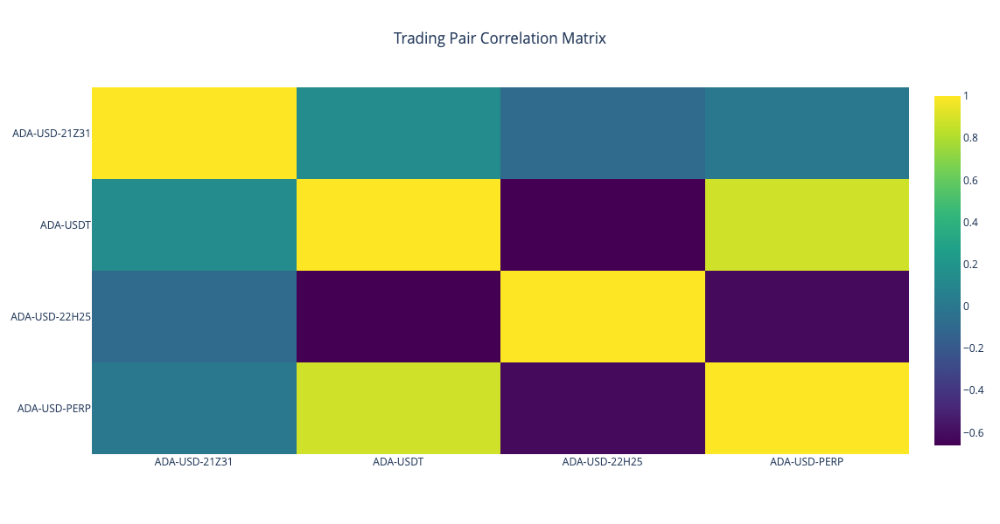

In [60]:
# ada_21z31_df, ada_usdt_df, ada_22h25_df, ada_perp_df

data = {'ADA-USD-21Z31' : ada_21z31_df["close"].head(n=6664).tolist(), 
        'ADA-USDT' : ada_usdt_df["close"].head(n=6664).tolist(), 
        'ADA-USD-22H25': ada_22h25_df["close"].head(n=6664).tolist(), 
        'ADA-USD-PERP': ada_perp_df["close"].head(n=6664).tolist()}

corr = pd.DataFrame(data).corr()


trace = Heatmap(z=corr.values,
                x=corr.index.values,
                y=corr.columns.values,
                colorscale='Viridis')
data_trace=[trace]

title = 'Trading Pair Correlation Matrix'

layout = go.Layout(
    title_text=title, 
    title_x=0.5, 
    width=600, 
    height=600,
    xaxis_showgrid=False,
    yaxis_showgrid=False,
    yaxis_autorange='reversed'
)

heat_fig = Figure(data = data_trace, layout = layout)

pyo.iplot(heat_fig)
